<b> In this workbook we will explore the price elasticities, with and without promotions. Also we will explore cross price elasticities for brand 5(own brand) with respect to brand 4(rival substitute brand)

In [1]:
import pandas as pd
import numpy as np
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns

# Data Preparation

<b>Data Load

In [2]:
purchase_df=pd.read_csv(r'C:\Users\sidha\Desktop\proj\purchase_data.csv')
purchase_df.head(10)

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,200000001,1,0,0,0,0,0,1.59,1.87,2.01,...,0,0,0,0,0,47,1,110866,1,0
1,200000001,11,0,0,0,0,0,1.51,1.89,1.99,...,0,0,0,0,0,47,1,110866,1,0
2,200000001,12,0,0,0,0,0,1.51,1.89,1.99,...,0,0,0,0,0,47,1,110866,1,0
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,...,0,0,0,0,0,47,1,110866,1,0
4,200000001,18,0,0,0,0,0,1.52,1.89,1.99,...,0,0,0,0,0,47,1,110866,1,0
5,200000001,23,0,0,0,0,0,1.50,1.90,1.99,...,0,0,0,0,0,47,1,110866,1,0
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,0,0,0,0,0,47,1,110866,1,0
7,200000001,37,0,0,0,2,1,1.50,1.90,1.99,...,0,0,0,0,0,47,1,110866,1,0
8,200000001,41,0,0,0,0,0,1.35,1.58,1.97,...,1,0,0,0,0,47,1,110866,1,0
9,200000001,43,0,0,0,0,0,1.35,1.58,1.97,...,1,0,0,0,0,47,1,110866,1,0


<b>Loading Models

In [3]:
scaler=pickle.load(open('scaler.pickle','rb'))
pca=pickle.load(open('pca.pickle','rb'))
kmeans_pca=pickle.load(open('kmeans_pca.pickle','rb'))

<b>Predicting segments<br></b>
Preparing data, adding segments information to data

In [4]:
features=purchase_df.iloc[:,17:]
features=scaler.transform(features)
features=pca.transform(features)
features=kmeans_pca.predict(features)
purchase_df_withseg=purchase_df.copy()
purchase_df_withseg['Segment']=features
purchase_df_withseg
features_dummies=pd.get_dummies(features,prefix='Segment',prefix_sep='-')
purchase_df_withseg=pd.concat([purchase_df_withseg,features_dummies],axis=1)
purchase_df_withseg

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment-0,Segment-1,Segment-2,Segment-3
0,200000001,1,0,0,0,0,0,1.59,1.87,2.01,...,47,1,110866,1,0,0,1,0,0,0
1,200000001,11,0,0,0,0,0,1.51,1.89,1.99,...,47,1,110866,1,0,0,1,0,0,0
2,200000001,12,0,0,0,0,0,1.51,1.89,1.99,...,47,1,110866,1,0,0,1,0,0,0
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,...,47,1,110866,1,0,0,1,0,0,0
4,200000001,18,0,0,0,0,0,1.52,1.89,1.99,...,47,1,110866,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58688,200000500,703,0,0,0,2,1,1.41,1.85,2.01,...,42,1,120946,1,0,0,1,0,0,0
58689,200000500,710,0,0,0,0,0,1.36,1.84,2.09,...,42,1,120946,1,0,0,1,0,0,0
58690,200000500,717,0,0,0,0,0,1.50,1.80,2.14,...,42,1,120946,1,0,0,1,0,0,0
58691,200000500,722,1,2,3,0,0,1.51,1.82,2.09,...,42,1,120946,1,0,0,1,0,0,0


<b>At this point, we have our purchase data, enriched with segment information, dervived from the models in the previous workbooks.<br><br>
From here we will be moving towards exploring price elasticities for various brands.

# Price Elasticity

<b>Exploring the general behavior, exploring price elasticities based on average prices, rather than for a particular brand.<br><br>
The main question we are trying to answer is - The probability of an individual buying the item of interest, irrespective of the brand the person chooses.

In [5]:
Y=pd.DataFrame(purchase_df_withseg['Incidence'])
Y

,Incidence
0,0
1,0
2,0
3,0
4,0
...,...
58688,0
58689,0
58690,0
58691,1


In [6]:
purchase_df_withseg['Average Price']=(purchase_df_withseg['Price_1']+
purchase_df_withseg['Price_2']+
purchase_df_withseg['Price_3']+
purchase_df_withseg['Price_4']+
purchase_df_withseg['Price_5'])/5

In [7]:
X=pd.DataFrame(purchase_df_withseg['Average Price'])
X

,Average Price
0,2.044
1,2.028
2,2.028
3,2.028
4,2.030
...,...
58688,2.060
58689,2.060
58690,2.086
58691,2.092


In [8]:
purchase_model=LogisticRegression(solver='sag')
purchase_model.fit(X,Y)


C:\Users\sidha\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


LogisticRegression(solver='sag')

In [9]:
purchase_model.coef_

array([[-2.34789001]])

<b>Based on the coefficient for the general model, we can see that the probability of buying a product of interest decreases with increase in price.<br><br>
Important thing to note is that, this is just the general behavior and not related to a particular segment, or audience of a brand. This may or may not hold true when you are looking at specific brands and segment behavior

In [10]:
purchase_df_withseg[['Price_1','Price_2','Price_3','Price_4','Price_5']].describe()

,Price_1,Price_2,Price_3,Price_4,Price_5
count,58693.000000,58693.000000,58693.000000,58693.000000,58693.000000
mean,1.392074,1.780999,2.006789,2.159945,2.654798
std,0.091139,0.170868,0.046867,0.089825,0.098272
min,1.100000,1.260000,1.870000,1.760000,2.110000
25%,1.340000,1.580000,1.970000,2.120000,2.630000
50%,1.390000,1.880000,2.010000,2.170000,2.670000
75%,1.470000,1.890000,2.060000,2.240000,2.700000
max,1.590000,1.900000,2.140000,2.260000,2.800000


<b>The above table, gives us information about pricing related to various brands. We will refer to this time and again to understand the purchase behavior of the customers for specific brands

<b>From this point we will be looking into price elasticities.<br><br></b>
<b>Note:<br></b>
<b>Price Elasticity:</b> Change in demand, with respect to change in price. Denoted by E.
In absolute terms, i.e. if |E| is >1, then elastic, less than 1 it is inelastic<b>    
E=beta coefficient * price range * (1- purchase probability)

In [11]:
test_prices=pd.DataFrame(np.arange(0.5,5.1,0.01))
test_prices

,0
0,0.50
1,0.51
2,0.52
3,0.53
4,0.54
...,...
455,5.05
456,5.06
457,5.07
458,5.08


In [12]:
Y_pred=purchase_model.predict_proba(test_prices)

In [13]:
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred[1]
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred.rename(columns={1:"Probability of Purchase"})
Y_pred

,Probability of Purchase
0,0.917935
1,0.916149
2,0.914327
3,0.912470
4,0.910577
...,...
455,0.000256
456,0.000251
457,0.000245
458,0.000239


In [14]:
purchase_model.coef_[:,0][0]*test_prices

,0
0,-1.173945
1,-1.197424
2,-1.220903
3,-1.244382
4,-1.267861
...,...
455,-11.856845
456,-11.880323
457,-11.903802
458,-11.927281


In [15]:
x=pd.DataFrame(Y_pred['Probability of Purchase'])
x['temp']=purchase_model.coef_[:,0][0]*test_prices
x['fin']=(1-x['Probability of Purchase'])*x['temp']
x['price']=test_prices
x

,Probability of Purchase,temp,fin,price
0,0.917935,-1.173945,-0.096340,0.50
1,0.916149,-1.197424,-0.100405,0.51
2,0.914327,-1.220903,-0.104598,0.52
3,0.912470,-1.244382,-0.108920,0.53
4,0.910577,-1.267861,-0.113376,0.54
...,...,...,...,...
455,0.000256,-11.856845,-11.853804,5.05
456,0.000251,-11.880323,-11.877347,5.06
457,0.000245,-11.903802,-11.900890,5.07
458,0.000239,-11.927281,-11.924430,5.08


In [16]:
pd.options.display.max_rows=None
x=x[['price','fin']]
x=x.rename(columns={'fin':'Price Elasticity','price':'Price'})
price_elasticity_df=x
price_elasticity_df

,Price,Price Elasticity
0,0.50,-0.096340
1,0.51,-0.100405
2,0.52,-0.104598
3,0.53,-0.108920
4,0.54,-0.113376
5,0.55,-0.117968
6,0.56,-0.122700
7,0.57,-0.127576
8,0.58,-0.132598
9,0.59,-0.137769


Text(0, 0.5, 'Price Elasticity')

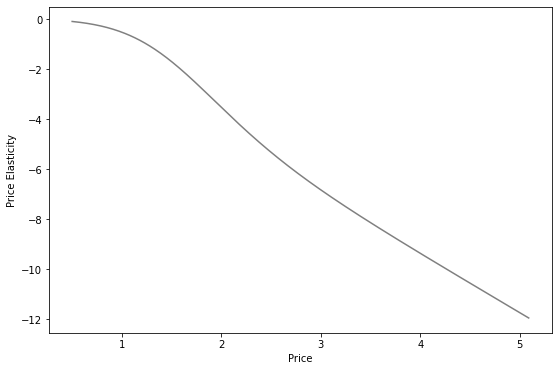

In [17]:
plt.figure(figsize=(9,6))
plt.plot(price_elasticity_df['Price'],price_elasticity_df['Price Elasticity'],color='grey')
plt.xlabel('Price')
plt.ylabel('Price Elasticity')

<b>Looking at the general model, we can say that the price is inelastic upto the value of 1.24, it is the exact point at which the absolute values of elasticity crosses 1. Therefore if the current price of a brand is less than 1.24 it would be profitable to increase the prize. The main reason for this is the decrease in revenue due to decrease in demand will be componsated by increase in revenue due to increase in price. Till the price value of $1.24, this compensation of revenue will be profitable.<br><br>
Once the price crosses 1.24 increasing price beyond wouldn't be an optimal decision, the main reason for this is beyond this price point the increase in price would not be able to compensate for decrease in demand, leading to decrease in revenue.

# Price Elasticity by segment

<b>Calculating price elasticities for segment 1(Carrer Driven), the process will be similar to above procedure, the only difference will be this process will be done for specific segment, as opposed to the entire data we have

In [18]:
purchase_df_seg1=purchase_df_withseg[purchase_df_withseg['Segment']==1]
purchase_df_seg1

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Education,Income,Occupation,Settlement size,Segment,Segment-0,Segment-1,Segment-2,Segment-3,Average Price
370,200000005,7,0,0,0,0,0,1.59,1.88,2.01,...,1,121466,1,2,1,0,1,0,0,2.046
371,200000005,13,0,0,0,0,0,1.51,1.89,1.99,...,1,121466,1,2,1,0,1,0,0,2.028
372,200000005,20,0,0,0,0,0,1.52,1.89,1.99,...,1,121466,1,2,1,0,1,0,0,2.030
373,200000005,32,0,0,0,0,0,1.50,1.90,1.99,...,1,121466,1,2,1,0,1,0,0,2.030
374,200000005,39,0,0,0,0,0,1.50,1.90,1.99,...,1,121466,1,2,1,0,1,0,0,2.030
375,200000005,47,0,0,0,0,0,1.35,1.58,1.97,...,1,121466,1,2,1,0,1,0,0,1.916
376,200000005,51,1,5,1,0,0,1.35,1.87,1.93,...,1,121466,1,2,1,0,1,0,0,1.966
377,200000005,57,1,5,1,5,1,1.39,1.90,1.91,...,1,121466,1,2,1,0,1,0,0,1.988
378,200000005,63,0,0,0,5,1,1.39,1.89,1.91,...,1,121466,1,2,1,0,1,0,0,1.996
379,200000005,68,0,0,0,0,0,1.39,1.89,1.91,...,1,121466,1,2,1,0,1,0,0,1.996


In [19]:
X=pd.DataFrame(purchase_df_seg1['Average Price'])
Y=pd.DataFrame(purchase_df_seg1['Incidence'])
model_seg1=LogisticRegression(solver='sag')
model_seg1.fit(X,Y)
model_seg1.coef_

C:\Users\sidha\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


array([[-1.72310827]])

<b>Based on the coefficient obtained, it seems that effect of decrease in demand due to increase in price is less pronounced in Segment 1(Career Driven) as compared to the overall behavior of all customers.

In [20]:
test_prices=pd.DataFrame(np.arange(0.5,5.1,0.01))
test_prices

,0
0,0.50
1,0.51
2,0.52
3,0.53
4,0.54
5,0.55
6,0.56
7,0.57
8,0.58
9,0.59


In [21]:
Y_pred=model_seg1.predict_proba(test_prices)
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred[1]
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred.rename(columns={1:'Purchase probability'})

In [22]:
temp=pd.DataFrame(model_seg1.coef_[0][0]*test_prices)
temp=temp.rename(columns={0:"temp_values"})
temp['purchase probability']=Y_pred['Purchase probability']
temp['Price Elasticity']=temp['temp_values']*(1-temp['purchase probability'])
Pe_seg1=pd.DataFrame(temp['Price Elasticity'])
Pe_seg1['Price']=test_prices[0]
Pe_seg1

,Price Elasticity,Price
0,-0.118707,0.50
1,-0.122891,0.51
2,-0.127170,0.52
3,-0.131543,0.53
4,-0.136014,0.54
5,-0.140584,0.55
6,-0.145253,0.56
7,-0.150024,0.57
8,-0.154898,0.58
9,-0.159877,0.59


Text(0, 0.5, 'Price Elasticity')

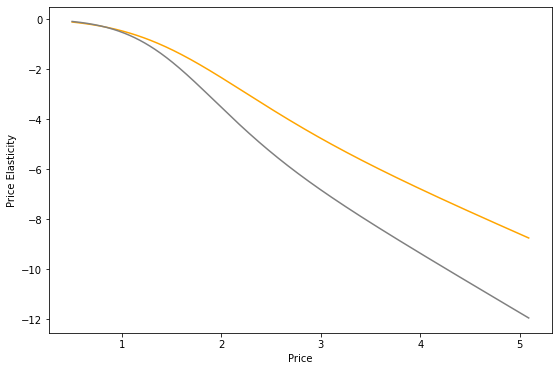

In [23]:
plt.figure(figsize=(9,6))
plt.plot(Pe_seg1['Price'],Pe_seg1['Price Elasticity'],color='orange')
plt.plot(price_elasticity_df['Price'],price_elasticity_df['Price Elasticity'],color='grey')
plt.xlabel('Price')
plt.ylabel('Price Elasticity')

<b>The career driven segment seems to be less sensitive to price, as compared to the general overall group. The point at which the segment becomes elastic is dollar 1.38. Before this point the increase in price, would compensate for decrease in demand, but after this price point decrease in demand would not be sufficiently compensated by increase in price.
<br>Also the less sensitivity to price, can be associated with higher spending power of this segment.

In [24]:
purchase_df_seg2=purchase_df_withseg[purchase_df_withseg['Segment']==2]
purchase_df_seg2
X=pd.DataFrame(purchase_df_seg2['Average Price'])
Y=pd.DataFrame(purchase_df_seg2['Incidence'])
model_seg2=LogisticRegression(solver='sag')
model_seg2.fit(X,Y)
print(model_seg2.coef_)
test_prices=pd.DataFrame(np.arange(0.5,5.1,0.01))
test_prices
Y_pred=model_seg2.predict_proba(test_prices)
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred[1]
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred.rename(columns={1:'Purchase probability'})
temp=pd.DataFrame(model_seg2.coef_[0][0]*test_prices)
temp=temp.rename(columns={0:"temp_values"})
temp['purchase probability']=Y_pred['Purchase probability']
temp['Price Elasticity']=temp['temp_values']*(1-temp['purchase probability'])
Pe_seg2=pd.DataFrame(temp['Price Elasticity'])
Pe_seg2['Price']=test_prices[0]


[[-1.50780634]]


C:\Users\sidha\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


<b>The coefficient magnitude of the model, is less than that of general model. This indicates that the effect of decrease in demand due to increase in price is less pronounced in Segment 2(Standard) as compared to the overall behavior of all customers.

In [25]:
pd.options.display.max_rows = 500
Pe_seg2

,Price Elasticity,Price
0,-0.211168,0.50
1,-0.217737,0.51
2,-0.224414,0.52
3,-0.231199,0.53
4,-0.238093,0.54
5,-0.245098,0.55
6,-0.252213,0.56
7,-0.259440,0.57
8,-0.266778,0.58
9,-0.274230,0.59


Text(0, 0.5, 'Price Elasticity')

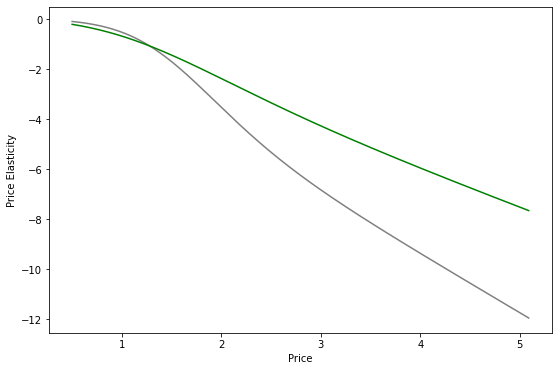

In [26]:
plt.figure(figsize=(9,6))
plt.plot(price_elasticity_df['Price'],price_elasticity_df['Price Elasticity'],color='grey')
plt.plot(Pe_seg2['Price'],Pe_seg2['Price Elasticity'],color='green')
plt.xlabel('Price')
plt.ylabel('Price Elasticity')

<b>The price elasticity for segment 2(standard), is similar to the overall flavor of all the customers, with a cross over value of 1.22 which is very close to the general value of 1.24.

In [27]:
purchase_df_seg3=purchase_df_withseg[purchase_df_withseg['Segment']==3]
purchase_df_seg3
X=pd.DataFrame(purchase_df_seg3['Average Price'])
Y=pd.DataFrame(purchase_df_seg3['Incidence'])
model_seg3=LogisticRegression(solver='sag')
model_seg3.fit(X,Y)
print(model_seg3.coef_)
test_prices=pd.DataFrame(np.arange(0.5,5.1,0.01))
test_prices
Y_pred=model_seg3.predict_proba(test_prices)
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred[1]
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred.rename(columns={1:'Purchase probability'})
temp=pd.DataFrame(model_seg3.coef_[0][0]*test_prices)
temp=temp.rename(columns={0:"temp_values"})
temp['purchase probability']=Y_pred['Purchase probability']
temp['Price Elasticity']=temp['temp_values']*(1-temp['purchase probability'])
Pe_seg3=pd.DataFrame(temp['Price Elasticity'])
Pe_seg3['Price']=test_prices[0]
Pe_seg3

[[-1.27647705]]


C:\Users\sidha\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


,Price Elasticity,Price
0,-0.165872,0.50
1,-0.170793,0.51
2,-0.175786,0.52
3,-0.180853,0.53
4,-0.185994,0.54
5,-0.191209,0.55
6,-0.196499,0.56
7,-0.201864,0.57
8,-0.207306,0.58
9,-0.212824,0.59


Text(0, 0.5, 'Price Elasticity')

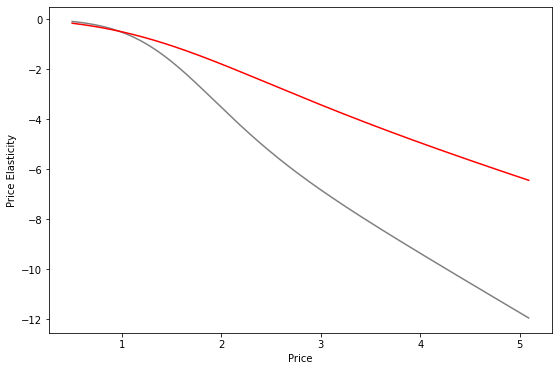

In [28]:
plt.figure(figsize=(9,6))
plt.plot(price_elasticity_df['Price'],price_elasticity_df['Price Elasticity'],color='grey')
plt.plot(Pe_seg3['Price'],Pe_seg3['Price Elasticity'],color='red')
plt.xlabel('Price')
plt.ylabel('Price Elasticity')

<b>The cross over point for segment 3(well off), is 1.45 which is very close to the career driven segment, the reason for this could be abundance of spending power for both the segments

In [29]:
purchase_df_seg0=purchase_df_withseg[purchase_df_withseg['Segment']==0]
purchase_df_seg0
X=pd.DataFrame(purchase_df_seg0['Average Price'])
Y=pd.DataFrame(purchase_df_seg0['Incidence'])
model_seg0=LogisticRegression(solver='sag')
model_seg0.fit(X,Y)
print(model_seg0.coef_)
test_prices=pd.DataFrame(np.arange(0.5,5.1,0.01))
test_prices
Y_pred=model_seg0.predict_proba(test_prices)
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred[1]
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred.rename(columns={1:'Purchase probability'})
temp=pd.DataFrame(model_seg0.coef_[0][0]*test_prices)
temp=temp.rename(columns={0:"temp_values"})
temp['purchase probability']=Y_pred['Purchase probability']
temp['Price Elasticity']=temp['temp_values']*(1-temp['purchase probability'])
Pe_seg0=pd.DataFrame(temp['Price Elasticity'])
Pe_seg0['Price']=test_prices[0]
pd.options.display.max_rows = 500
Pe_seg0

[[-3.60344783]]


C:\Users\sidha\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


,Price Elasticity,Price
0,-0.032299,0.50
1,-0.034131,0.51
2,-0.036052,0.52
3,-0.038067,0.53
4,-0.040179,0.54
5,-0.042393,0.55
6,-0.044712,0.56
7,-0.047142,0.57
8,-0.049687,0.58
9,-0.052353,0.59


Text(0, 0.5, 'Price Elasticity')

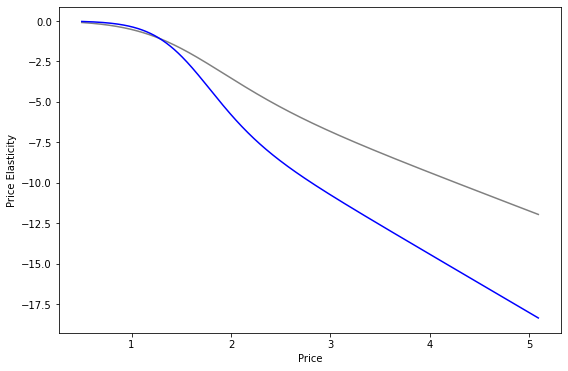

In [30]:
plt.figure(figsize=(9,6))
plt.plot(price_elasticity_df['Price'],price_elasticity_df['Price Elasticity'],color='grey')
plt.plot(Pe_seg0['Price'],Pe_seg0['Price Elasticity'],color='blue')
plt.xlabel('Price')
plt.ylabel('Price Elasticity')

<b>The effect of decrease in demand due to increase in price, seems to be the most dominant on this segment(Struggling). This fits perfectly with the assumption of lower spending power of the segment.

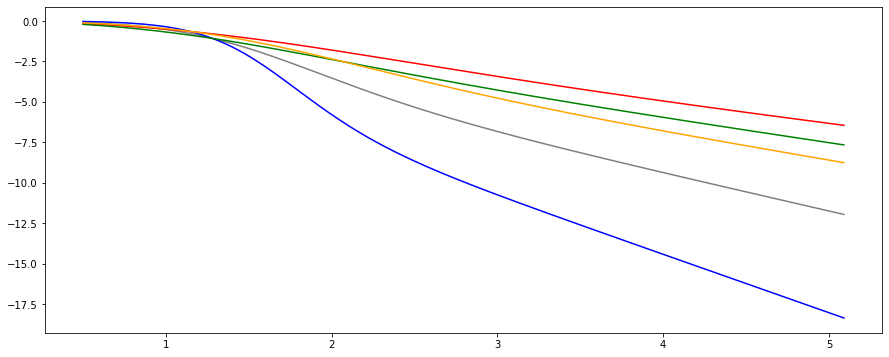

In [31]:
plt.figure(figsize=(15,6))

plt.plot(price_elasticity_df['Price'],price_elasticity_df['Price Elasticity'],color='grey')

plt.plot(Pe_seg0['Price'],Pe_seg0['Price Elasticity'],color='blue')

plt.plot(Pe_seg3['Price'],Pe_seg3['Price Elasticity'],color='red')

plt.plot(Pe_seg2['Price'],Pe_seg2['Price Elasticity'],color='green')

plt.plot(Pe_seg1['Price'],Pe_seg1['Price Elasticity'],color='orange')



# Price Elasticity with and without Promotions

<b>Price Elasticity with promotion

<b>Similar to the procedure for estimating price elasticity in the general model - over all dataset, we will take a similar approch here with the only difference being the model will be tested with promotion indicator set to 1.

In [32]:
X=pd.DataFrame(purchase_df['Price_1']+
               purchase_df['Price_2']+
               purchase_df['Price_3']+
               purchase_df['Price_4']+
               purchase_df['Price_5'])/5
X=X.rename(columns={0:"Average Price"})

In [33]:
X['Average promotion']=(purchase_df['Promotion_1']+purchase_df['Promotion_2']+purchase_df['Promotion_3']+purchase_df['Promotion_4']+purchase_df['Promotion_5'])/5

In [34]:
Y=pd.DataFrame(purchase_df['Incidence'])
Y

,Incidence
0,0
1,0
2,0
3,0
4,0
...,...
58688,0
58689,0
58690,0
58691,1


In [35]:
model=LogisticRegression(solver='sag')
model.fit(X,Y)

C:\Users\sidha\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


LogisticRegression(solver='sag')

In [36]:
model.coef_

array([[-1.49390797,  0.561424  ]])

In [37]:
test=pd.DataFrame(np.arange(0.5,5.1,0.01))
test=test.rename(columns={0:'Price'})
test['Promotion']=1
test.head(5)

,Price,Promotion
0,0.50,1
1,0.51,1
2,0.52,1
3,0.53,1
4,0.54,1


In [38]:
Y_pred=model.predict_proba(test)

In [39]:
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred[1]
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred.rename(columns={1:'Purchase Probability'})
Y_pred.head()

,Purchase Probability
0,0.831667
1,0.829566
2,0.827443
3,0.825300
4,0.823135


In [40]:
temp=pd.DataFrame(model.coef_[0][0]*test['Price'])
temp=temp.rename(columns={"Price":"temp_value"})
temp['Purchase Probability']=Y_pred
temp['fin']=temp['temp_value']*(1-temp['Purchase Probability'])
temp['Price']=test['Price']
temp=temp[['fin','Price']]
PE_withpromotion=temp
PE_withpromotion=PE_withpromotion.rename(columns={'fin':'Price Elasticity'})
PE_withpromotion

,Price Elasticity,Price
0,-0.125737,0.50
1,-0.129853,0.51
2,-0.134048,0.52
3,-0.138323,0.53
4,-0.142679,0.54
5,-0.147116,0.55
6,-0.151637,0.56
7,-0.156242,0.57
8,-0.160931,0.58
9,-0.165707,0.59


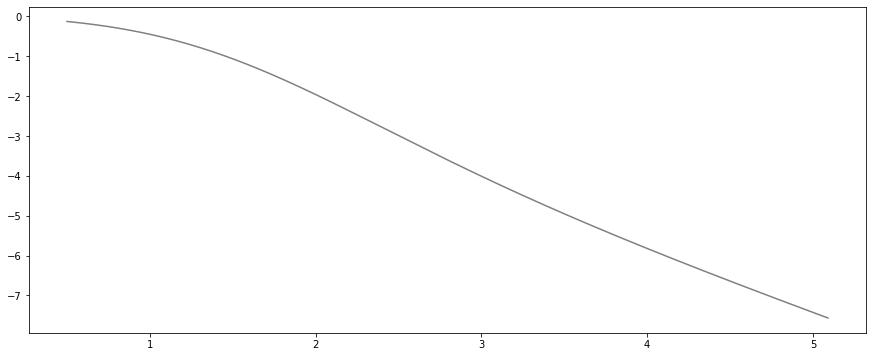

In [41]:
plt.figure(figsize=(15,6))
plt.plot(PE_withpromotion['Price'],PE_withpromotion['Price Elasticity'],color='grey')

<b>Price Elasticity without promotion

In [42]:
test=pd.DataFrame(np.arange(0.5,5.1,0.01))
test=test.rename(columns={0:'Price'})
test['Promotion']=0
test.head(5)

,Price,Promotion
0,0.50,0
1,0.51,0
2,0.52,0
3,0.53,0
4,0.54,0


In [43]:
Y_pred=model.predict_proba(test)
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred[1]
Y_pred=pd.DataFrame(Y_pred)
Y_pred=Y_pred.rename(columns={1:'Purchase Probability'})
Y_pred.head()

,Purchase Probability
0,0.738090
1,0.735192
2,0.732274
3,0.729335
4,0.726376


In [44]:
temp=pd.DataFrame(model.coef_[0][0]*test['Price'])
temp=temp.rename(columns={"Price":"temp_value"})
temp['Purchase Probability']=Y_pred
temp['fin']=temp['temp_value']*(1-temp['Purchase Probability'])
temp['Price']=test['Price']
temp=temp[['fin','Price']]
PE_without_promotion=temp
PE_without_promotion=PE_without_promotion.rename(columns={'fin':'Price Elasticity'})
PE_without_promotion

,Price Elasticity,Price
0,-0.195634,0.50
1,-0.201755,0.51
2,-0.207978,0.52
3,-0.214305,0.53
4,-0.220736,0.54
5,-0.227271,0.55
6,-0.233912,0.56
7,-0.240660,0.57
8,-0.247515,0.58
9,-0.254478,0.59


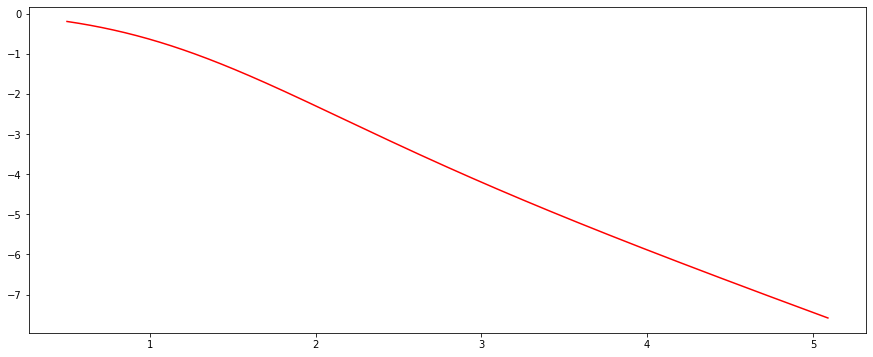

In [45]:
plt.figure(figsize=(15,6))
plt.plot(PE_without_promotion['Price'],PE_without_promotion['Price Elasticity'],color='red')

<b>Comparing with and without promotion,general(without segmentation)

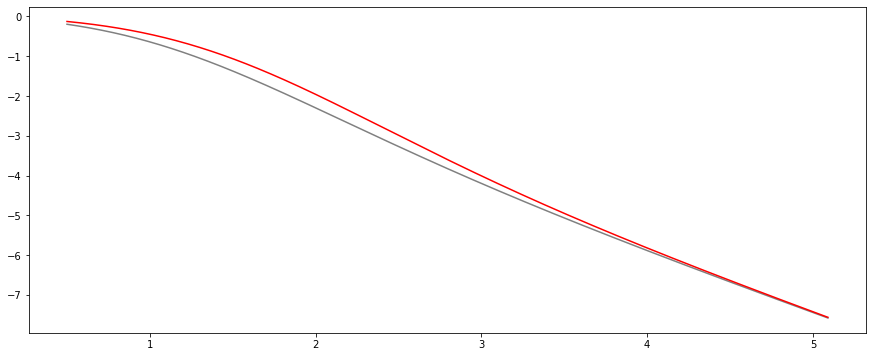

In [46]:
plt.figure(figsize=(15,6))
plt.plot(PE_without_promotion['Price'],PE_without_promotion['Price Elasticity'],color='grey')
plt.plot(PE_withpromotion['Price'],PE_withpromotion['Price Elasticity'],color='red')

<b>
Red Line - with promotion<br>
Grey Line - without promotion<br>

From the above visual, we can infer that the price range is inelastic for a larger range when there are promotions into play as opposed to when promotion is not into play. This could point us to having higher prices set in advance and then applying promotions to maximize revenue.
    
<br>Further analysis, can be done on effect of promotion for each segment. Further more similar analysis can be done for individuals belonging particular brands

<b>Having looked at particular segments and explored the probability of a person purchasing an item of interest, we will now look into probabilities of choosing one brand over another. We will explore into price elasticity for our brand (brand 5) and cross brand price elasticity i.e. brand 5 with respect to brand 4 

# Brand Choice

<b>Training model based on prices of different brands, and the corresponding choice of brand purchase made by customer 

In [47]:
pd.options.display.max_rows = 100
brand_choice = purchase_df_withseg[purchase_df_withseg['Incidence']==1]
brand_choice

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Education,Income,Occupation,Settlement size,Segment,Segment-0,Segment-1,Segment-2,Segment-3,Average Price
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,1,110866,1,0,0,1,0,0,0,2.030
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,1,110866,1,0,0,1,0,0,0,1.988
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,1,110866,1,0,0,1,0,0,0,2.000
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,1,110866,1,0,0,1,0,0,0,1.878
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,1,110866,1,0,0,1,0,0,0,1.914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58621,200000500,296,1,2,6,0,0,1.48,1.89,2.01,...,1,120946,1,0,0,1,0,0,0,2.050
58648,200000500,460,1,1,12,0,0,1.35,1.57,2.02,...,1,120946,1,0,0,1,0,0,0,1.970
58674,200000500,641,1,2,7,0,0,1.50,1.85,2.06,...,1,120946,1,0,0,1,0,0,0,2.088
58687,200000500,697,1,2,6,0,0,1.42,1.51,1.97,...,1,120946,1,0,0,1,0,0,0,1.984


In [48]:
Y=brand_choice['Brand']

In [49]:
X=brand_choice[['Price_1','Price_2','Price_3','Price_4','Price_5']]

In [50]:
model_brand_choice=LogisticRegression(solver='sag',multi_class='multinomial')
model_brand_choice.fit(X,Y)

LogisticRegression(multi_class='multinomial', solver='sag')

In [51]:
brand_choice_coef=pd.DataFrame(np.transpose(model_brand_choice.coef_))

In [52]:
brand_choice_coef.columns=[['Brand1','Brand2','Brand3','Brand4','Brand5']]
brand_choice_coef.index=[['Price1','Price2','Price3','Price4','Price5']]
brand_choice_coef

,Brand1,Brand2,Brand3,Brand4,Brand5
Price1,-3.915954,1.274615,1.624176,0.574540,0.442623
Price2,0.658463,-1.879854,0.562103,0.395589,0.263699
Price3,2.417735,-0.212636,0.500840,-1.400597,-1.305342
Price4,0.704091,-0.206338,1.039494,-1.246241,-0.291006
Price5,-0.202101,0.587874,0.452768,0.249355,-1.087896


<b>Price elasticity for own Brand (Brand 5) - Competitors prices constant - Set to mean value.<br>
For our own brand we use the entire price range while testing to understand the price elasticity

In [53]:
price_range=np.arange(1,5,0.01)

In [54]:
price_range_ownbrand=pd.DataFrame(index=np.arange(price_range.size))
price_range_ownbrand['Price1']=brand_choice['Price_1'].mean()
price_range_ownbrand['Price2']=brand_choice['Price_2'].mean()
price_range_ownbrand['Price3']=brand_choice['Price_3'].mean()
price_range_ownbrand['Price4']=brand_choice['Price_4'].mean()
price_range_ownbrand['Price5']=price_range


In [55]:
price_range_ownbrand.head(25)

,Price1,Price2,Price3,Price4,Price5
0,1.384559,1.764717,2.006694,2.159658,1.00
1,1.384559,1.764717,2.006694,2.159658,1.01
2,1.384559,1.764717,2.006694,2.159658,1.02
3,1.384559,1.764717,2.006694,2.159658,1.03
4,1.384559,1.764717,2.006694,2.159658,1.04
5,1.384559,1.764717,2.006694,2.159658,1.05
6,1.384559,1.764717,2.006694,2.159658,1.06
7,1.384559,1.764717,2.006694,2.159658,1.07
8,1.384559,1.764717,2.006694,2.159658,1.08
9,1.384559,1.764717,2.006694,2.159658,1.09


In [56]:
Y_pred=model_brand_choice.predict_proba(price_range_ownbrand)

In [70]:
Y_pred=pd.DataFrame(Y_pred)
Y_pred.columns=[["Brand1","Brand2","Brand3","Brand4","Brand5"]]
Y_pred

,Brand1,Brand2,Brand3,Brand4,Brand5
0,0.020898,0.130693,0.006279,0.359734,0.482396
1,0.021171,0.131199,0.006382,0.357392,0.483855
2,0.021447,0.131704,0.006487,0.355056,0.485306
3,0.021726,0.132207,0.006593,0.352725,0.486748
4,0.022008,0.132709,0.006701,0.350401,0.488181
5,0.022293,0.133209,0.006811,0.348082,0.489605
6,0.022581,0.133707,0.006922,0.345770,0.491021
7,0.022872,0.134203,0.007035,0.343463,0.492427
8,0.023166,0.134698,0.007149,0.341163,0.493823
9,0.023464,0.135191,0.007266,0.338869,0.495211


<b>The above table gives the purchase probabilities of brands at various price levels of brand 5.<br>
The price range is in ascending order.<br>
Based on that it is intuitive that the probability of brand 5 decreases as the price increases.

In [58]:
beta=brand_choice_coef.iloc[4,4]

In [59]:
temp=pd.DataFrame(beta*price_range)
temp['Purchase Probability']=Y_pred[["Brand5"]]
temp=temp.rename(columns={0:"temp_value"})

In [60]:
temp["Price Elasticity_Brand 5"]=temp["temp_value"]*(1-temp["Purchase Probability"])

In [61]:
PE_Brand5=pd.DataFrame(temp["Price Elasticity_Brand 5"])
PE_Brand5["Price"]=price_range

In [62]:
pd.options.display.max_rows = 500
PE_Brand5

,Price Elasticity_Brand 5,Price
0,-0.172649,1.00
1,-0.176315,1.01
2,-0.180038,1.02
3,-0.183820,1.03
4,-0.187660,1.04
5,-0.191560,1.05
6,-0.195520,1.06
7,-0.199540,1.07
8,-0.203622,1.08
9,-0.207767,1.09


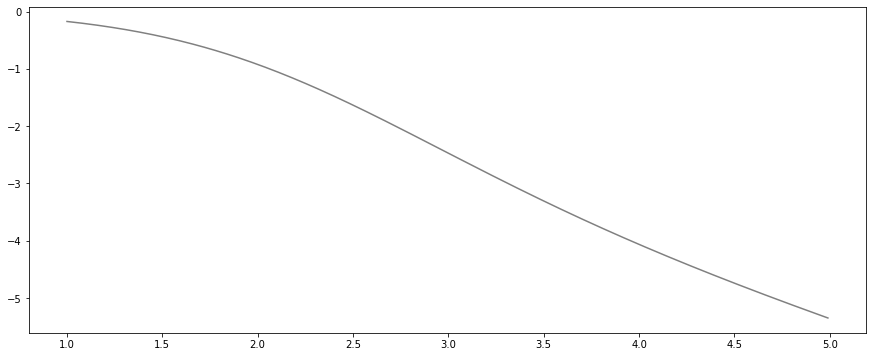

In [63]:
plt.figure(figsize=(15,6))
plt.plot(PE_Brand5["Price"],PE_Brand5["Price Elasticity_Brand 5"],color='grey')

<b>Based on the price elasticity for brand 5, the price range seems to be inelastic for values till 2.07, after which it crosses over and becomes elastic. This could mean increasing the price till 2.07 will be rewarding as it will be able to compensate for decrease in demand, and push the revenue higher. Further of price point of 2.07 this is not expected to happen

<b>Brand 4 is the biggest competitor for brand 5 in terms of price point and type of audience it captures. For both of them the biggest segment of sale is Career Driven segment and Well off segment.

Based on this fact, we would want to look at price elasticity of brand .....................................

<b>Cross Price Elasticity of Brand 5, with respect to Brand 4

In [101]:
price_range_crossbrand=pd.DataFrame(index=np.arange(price_range.size))
price_range_crossbrand['Price1']=brand_choice['Price_1'].mean()
price_range_crossbrand['Price2']=brand_choice['Price_2'].mean()
price_range_crossbrand['Price3']=brand_choice['Price_3'].mean()
price_range_crossbrand['Price4']=price_range
price_range_crossbrand['Price5']=brand_choice['Price_5'].mean()

In [102]:
Y_pred=model_brand_choice.predict_proba(price_range_crossbrand)

In [103]:
Y_pred=pd.DataFrame(Y_pred)
Y_pred.columns=[["Brand1","Brand2","Brand3","Brand4","Brand5"]]
Y_pred

,Brand1,Brand2,Brand3,Brand4,Brand5
0,0.020853,0.217511,0.009574,0.480842,0.271220
1,0.021147,0.218580,0.009742,0.478207,0.272323
2,0.021444,0.219648,0.009912,0.475573,0.273422
3,0.021746,0.220714,0.010085,0.472937,0.274517
4,0.022050,0.221779,0.010261,0.470302,0.275607
5,0.022359,0.222841,0.010439,0.467667,0.276694
6,0.022671,0.223902,0.010621,0.465031,0.277775
7,0.022986,0.224961,0.010805,0.462396,0.278852
8,0.023305,0.226017,0.010991,0.459762,0.279925
9,0.023628,0.227071,0.011181,0.457128,0.280992


In [104]:
temp=pd.DataFrame(-beta*price_range_crossbrand['Price4'])
temp=temp.rename(columns={"Price4":"temp_value"})
temp["Purchase_Probability"]=Y_pred[["Brand4"]]
temp
temp=pd.DataFrame(temp)
temp['Price Elasticity']=temp['temp_value']*(temp['Purchase_Probability'])


In [105]:
pd.options.display.max_rows = 500
temp
PeBrand_CB_Brand4=pd.DataFrame(temp['Price Elasticity'])
PeBrand_CB_Brand4['Price']=pd.DataFrame(price_range)
PeBrand_CB_Brand4


,Price Elasticity,Price
0,0.212174,1.00
1,0.213121,1.01
2,0.214046,1.02
3,0.214946,1.03
4,0.215824,1.04
5,0.216678,1.05
6,0.217509,1.06
7,0.218317,1.07
8,0.219102,1.08
9,0.219863,1.09


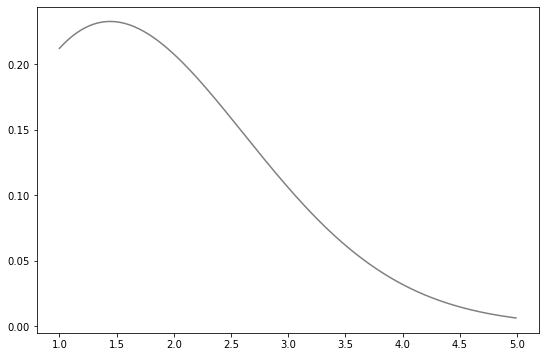

In [106]:
plt.figure(figsize=(9,6))
plt.plot(PeBrand_CB_Brand4["Price"],PeBrand_CB_Brand4["Price Elasticity"],color='grey')



<b>The elasticity values are positive, which are an indication of as the competitor increases price, the purchase probability of our brand increases.
If absolute elasticity values of own brand is less than absolute elasticity values of cross brand, then the rival brand is a strong substitute, this phenomena occurs price till the price range of 1.48. This value is outside the price range of the competitors natural pricing which indicates that the competitor in its natural price range is not a strong substitute, and although the elasticity is positive there will be some increase in purchase probability of our brand, this will get more and more prominent as rivals price increases

<b>The well off segment contributes a huge chunk to revenue of Brand 4, we will explore the cross brand elasticity of brand 5 with respect to brand 4 for the well off segment, it will be intersting to see how the well off segment behave to changes in prices of the brand 4

In [107]:
brand_choice_seg_WO=purchase_df_withseg[purchase_df_withseg['Incidence']==1]
brand_choice_seg_WO=brand_choice_seg_WO[brand_choice_seg_WO['Segment']==3]
brand_choice_seg_WO

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Education,Income,Occupation,Settlement size,Segment,Segment-0,Segment-1,Segment-2,Segment-3,Average Price
101,200000002,6,1,4,1,0,0,1.59,1.87,2.01,...,2,159052,2,1,3,0,0,0,1,2.044
115,200000002,100,1,4,2,0,0,1.47,1.90,1.95,...,2,159052,2,1,3,0,0,0,1,2.022
138,200000002,283,1,4,3,0,0,1.37,1.89,2.00,...,2,159052,2,1,3,0,0,0,1,2.008
141,200000002,307,1,4,1,0,0,1.34,1.89,2.01,...,2,159052,2,1,3,0,0,0,1,1.990
153,200000002,422,1,4,1,0,0,1.34,1.89,2.02,...,2,159052,2,1,3,0,0,0,1,2.022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57346,200000489,687,1,4,1,4,1,1.50,1.87,2.06,...,2,193816,2,1,3,0,0,0,1,2.090
57347,200000489,693,1,4,2,4,1,1.42,1.51,2.02,...,2,193816,2,1,3,0,0,0,1,1.992
57348,200000489,701,1,4,3,4,1,1.42,1.85,1.99,...,2,193816,2,1,3,0,0,0,1,2.052
57350,200000489,715,1,4,2,0,0,1.50,1.80,2.09,...,2,193816,2,1,3,0,0,0,1,2.084


In [108]:
Y=brand_choice_seg_WO['Brand']

In [109]:
brand_choice_seg_WO=pd.get_dummies(brand_choice_seg_WO,columns=['Brand'],prefix='Brand',prefix_sep='_')

In [110]:
X=brand_choice_seg_WO[['Price_1','Price_2','Price_3','Price_4','Price_5']]

In [111]:
model_brand_choice_seg_WO=LogisticRegression(solver='sag',multi_class='multinomial',max_iter=300)
model_brand_choice_seg_WO.fit(X,Y)

LogisticRegression(max_iter=300, multi_class='multinomial', solver='sag')

In [112]:
coef=pd.DataFrame(model_brand_choice_seg_WO.coef_.transpose())
coef=coef.rename(columns={0:"Brand 1",1:"Brand 2",2:"Brand 3",3:"Brand 4",4:"Brand 5"})
coef.index=[['Price1','Price2','Price3','Price4','Price5']]
coef

,Brand 1,Brand 2,Brand 3,Brand 4,Brand 5
Price1,-2.145481,1.333717,0.775148,0.134511,-0.097895
Price2,-0.947885,-1.368571,1.240161,0.789582,0.286713
Price3,2.001530,-1.664979,-0.412885,-0.010146,0.086481
Price4,2.517202,0.945864,-0.202883,-1.917225,-1.342959
Price5,-0.997295,-0.300187,1.180746,0.557942,-0.441206


In [113]:
price_range_ownbrand_s3=pd.DataFrame(index=np.arange(price_range.size))
price_range_ownbrand_s3['Price1']=brand_choice_seg_WO['Price_1'].mean()
price_range_ownbrand_s3['Price2']=brand_choice_seg_WO['Price_2'].mean()
price_range_ownbrand_s3['Price3']=brand_choice_seg_WO['Price_3'].mean()
price_range_ownbrand_s3['Price4']=brand_choice_seg_WO['Price_4'].mean()
price_range_ownbrand_s3['Price5']=price_range

In [114]:
price_range_ownbrand_s3.head(25)

,Price1,Price2,Price3,Price4,Price5
0,1.38856,1.778878,2.004479,2.156263,1.00
1,1.38856,1.778878,2.004479,2.156263,1.01
2,1.38856,1.778878,2.004479,2.156263,1.02
3,1.38856,1.778878,2.004479,2.156263,1.03
4,1.38856,1.778878,2.004479,2.156263,1.04
5,1.38856,1.778878,2.004479,2.156263,1.05
6,1.38856,1.778878,2.004479,2.156263,1.06
7,1.38856,1.778878,2.004479,2.156263,1.07
8,1.38856,1.778878,2.004479,2.156263,1.08
9,1.38856,1.778878,2.004479,2.156263,1.09


In [115]:
Y_pred=model_brand_choice.predict_proba(price_range_ownbrand_s3)
Y_pred=pd.DataFrame(Y_pred)
Y_pred

,0,1,2,3,4
0,0.046375,0.045270,0.010891,0.054358,0.843106
1,0.046691,0.045939,0.011037,0.054976,0.841357
2,0.047008,0.046618,0.011185,0.055599,0.839591
3,0.047325,0.047305,0.011334,0.056228,0.837808
4,0.047644,0.048001,0.011485,0.056862,0.836008
5,0.047963,0.048706,0.011638,0.057502,0.834190
6,0.048283,0.049420,0.011793,0.058148,0.832355
7,0.048604,0.050143,0.011949,0.058800,0.830503
8,0.048926,0.050876,0.012108,0.059457,0.828633
9,0.049249,0.051618,0.012268,0.060121,0.826745


In [116]:
Y_pred.columns=[["Brand1","Brand2","Brand3","Brand4","Brand5"]]
Y_pred

,Brand1,Brand2,Brand3,Brand4,Brand5
0,0.046375,0.045270,0.010891,0.054358,0.843106
1,0.046691,0.045939,0.011037,0.054976,0.841357
2,0.047008,0.046618,0.011185,0.055599,0.839591
3,0.047325,0.047305,0.011334,0.056228,0.837808
4,0.047644,0.048001,0.011485,0.056862,0.836008
5,0.047963,0.048706,0.011638,0.057502,0.834190
6,0.048283,0.049420,0.011793,0.058148,0.832355
7,0.048604,0.050143,0.011949,0.058800,0.830503
8,0.048926,0.050876,0.012108,0.059457,0.828633
9,0.049249,0.051618,0.012268,0.060121,0.826745


In [117]:
beta=coef.iloc[4,4]
beta

-0.4412064732273652

In [118]:
temp=pd.DataFrame(beta*price_range)
temp['Purchase Probability']=Y_pred[["Brand5"]]
temp=temp.rename(columns={0:"temp_value"})

In [119]:
temp["Price Elasticity_Brand 5"]=temp["temp_value"]*(1-temp["Purchase Probability"])

In [120]:
PE_Brand5_seg_WO=pd.DataFrame(temp["Price Elasticity_Brand 5"])
PE_Brand5_seg_WO["Price"]=price_range

In [121]:
pd.options.display.max_rows = 500
PE_Brand5_seg_WO

,Price Elasticity_Brand 5,Price
0,-0.069223,1.00
1,-0.070694,1.01
2,-0.072189,1.02
3,-0.073707,1.03
4,-0.075249,1.04
5,-0.076814,1.05
6,-0.078404,1.06
7,-0.080018,1.07
8,-0.081657,1.08
9,-0.083321,1.09


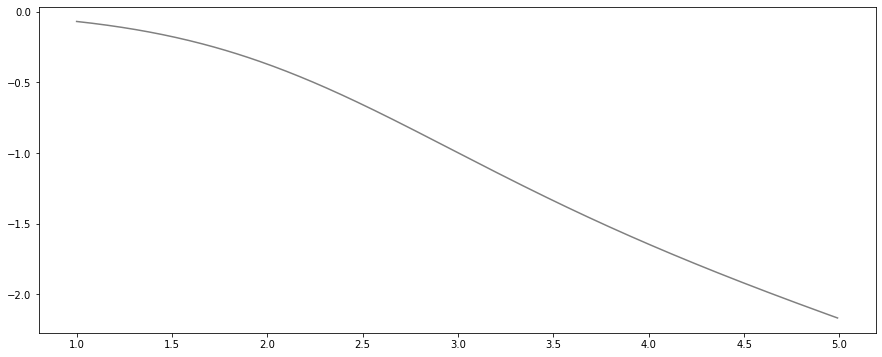

In [122]:
plt.figure(figsize=(15,6))
plt.plot(PE_Brand5_seg_WO["Price"],PE_Brand5_seg_WO["Price Elasticity_Brand 5"],color='grey')

In [123]:
price_range_crossbrand_s3=pd.DataFrame(index=np.arange(price_range.size))
price_range_crossbrand_s3['Price1']=brand_choice_seg_WO['Price_1'].mean()
price_range_crossbrand_s3['Price2']=brand_choice_seg_WO['Price_2'].mean()
price_range_crossbrand_s3['Price3']=brand_choice_seg_WO['Price_3'].mean()
price_range_crossbrand_s3['Price4']=price_range
price_range_crossbrand_s3['Price5']=brand_choice_seg_WO['Price_5'].mean()

In [124]:
Y_pred=model_brand_choice.predict_proba(price_range_crossbrand_s3)

In [125]:
Y_pred=pd.DataFrame(Y_pred)
Y_pred.columns=[["Brand1","Brand2","Brand3","Brand4","Brand5"]]
Y_pred

,Brand1,Brand2,Brand3,Brand4,Brand5
0,0.020549,0.212366,0.009675,0.484742,0.272668
1,0.020840,0.213420,0.009845,0.482107,0.273788
2,0.021134,0.214472,0.010017,0.479472,0.274905
3,0.021432,0.215522,0.010193,0.476836,0.276018
4,0.021733,0.216571,0.010371,0.474199,0.277126
5,0.022038,0.217618,0.010551,0.471562,0.278230
6,0.022346,0.218663,0.010735,0.468925,0.279330
7,0.022658,0.219707,0.010921,0.466288,0.280425
8,0.022974,0.220748,0.011111,0.463652,0.281516
9,0.023293,0.221787,0.011303,0.461015,0.282602


In [126]:
temp=pd.DataFrame(-beta*price_range_crossbrand_s3['Price4'])
temp=temp.rename(columns={"Price4":"temp_value"})
temp["Purchase_Probability"]=Y_pred[["Brand4"]]
temp
temp=pd.DataFrame(temp)
temp['Price Elasticity']=temp['temp_value']*(temp['Purchase_Probability'])

In [127]:
pd.options.display.max_rows = 500
temp
PeBrand_CB_Brand4_s3=pd.DataFrame(temp['Price Elasticity'])
PeBrand_CB_Brand4_s3['Price']=pd.DataFrame(price_range)
PeBrand_CB_Brand4_s3

,Price Elasticity,Price
0,0.213871,1.00
1,0.214836,1.01
2,0.215777,1.02
3,0.216694,1.03
4,0.217588,1.04
5,0.218459,1.05
6,0.219306,1.06
7,0.220131,1.07
8,0.220931,1.08
9,0.221709,1.09


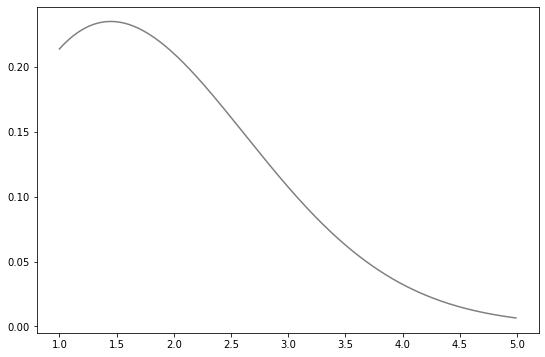

In [128]:
plt.figure(figsize=(9,6))
plt.plot(PeBrand_CB_Brand4_s3["Price"],PeBrand_CB_Brand4_s3["Price Elasticity"],color='grey')
